In [1]:
pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 MB 9.9 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import io as sio
import seaborn as sns 
from sklearn.preprocessing import LabelBinarizer , StandardScaler ,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , accuracy_score,ConfusionMatrixDisplay
from xgboost import XGBClassifier, plot_importance
from sklearn.linear_model import LogisticRegression , RidgeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier 
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from numpy import absolute
from numpy import sqrt
from numpy import mean
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
import pandas as pd
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

from sklearn.utils import resample
from sklearn.ensemble import AdaBoostClassifier , GradientBoostingClassifier , VotingClassifier , RandomForestClassifier

In [3]:
data = pd.read_csv("/content/ObesityDataSet_raw_and_data_sinthetic.csv")
data.head(10)

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II
5,Male,29.0,1.62,53.0,no,yes,2.0,3.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Automobile,Normal_Weight
6,Female,23.0,1.50,55.0,yes,yes,3.0,3.0,Sometimes,no,2.0,no,1.0,0.0,Sometimes,Motorbike,Normal_Weight
7,Male,22.0,1.64,53.0,no,no,2.0,3.0,Sometimes,no,2.0,no,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
8,Male,24.0,1.78,64.0,yes,yes,3.0,3.0,Sometimes,no,2.0,no,1.0,1.0,Frequently,Public_Transportation,Normal_Weight
9,Male,22.0,1.72,68.0,yes,yes,2.0,3.0,Sometimes,no,2.0,no,1.0,1.0,no,Public_Transportation,Normal_Weight


In [ ]:
data.tail()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III
2110,Female,23.664709,1.738836,133.472641,yes,yes,3.0,3.0,Sometimes,no,2.863513,no,1.026452,0.714137,Sometimes,Public_Transportation,Obesity_Type_III


In [ ]:
#Shape of Data
data.shape

(2111, 17)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [ ]:
#lets describe the data
data.describe()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,24.312600,1.701677,86.586058,2.419043,2.685628,2.008011,1.010298,0.657866
std,6.345968,0.093305,26.191172,0.533927,0.778039,0.612953,0.850592,0.608927
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,19.947192,1.630000,65.473343,2.000000,2.658738,1.584812,0.124505,0.000000
50%,22.777890,1.700499,83.000000,2.385502,3.000000,2.000000,1.000000,0.625350
75%,26.000000,1.768464,107.430682,3.000000,3.000000,2.477420,1.666678,1.000000
max,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000


In [ ]:
data.count()

Gender                            2111
Age                               2111
Height                            2111
Weight                            2111
family_history_with_overweight    2111
FAVC                              2111
FCVC                              2111
NCP                               2111
CAEC                              2111
SMOKE                             2111
CH2O                              2111
SCC                               2111
FAF                               2111
TUE                               2111
CALC                              2111
MTRANS                            2111
NObeyesdad                        2111
dtype: int64

In [4]:
label_encoder = preprocessing.LabelEncoder()
data['Gender']= label_encoder.fit_transform(data['Gender'])
  
data['Gender'].unique()

array([0, 1])

In [5]:
label_encoder = preprocessing.LabelEncoder()
data['family_history_with_overweight']= label_encoder.fit_transform(data['family_history_with_overweight'])
  
data['family_history_with_overweight'].unique()

array([1, 0])

In [6]:
label_encoder = preprocessing.LabelEncoder()
data['FAVC']= label_encoder.fit_transform(data['FAVC'])
  
data['FAVC'].unique()

array([0, 1])

In [7]:
label_encoder = preprocessing.LabelEncoder()
data['CAEC']= label_encoder.fit_transform(data['CAEC'])
  
data['CAEC'].unique()

array([2, 1, 0, 3])

In [8]:
label_encoder = preprocessing.LabelEncoder()
data['SMOKE']= label_encoder.fit_transform(data['SMOKE'])
  
data['SMOKE'].unique()

array([0, 1])

In [9]:
label_encoder = preprocessing.LabelEncoder()
data['CALC']= label_encoder.fit_transform(data['CALC'])
  
data['CALC'].unique()

array([3, 2, 1, 0])

In [10]:
label_encoder = preprocessing.LabelEncoder()
data['MTRANS']= label_encoder.fit_transform(data['MTRANS'])
  
data['MTRANS'].unique()

array([3, 4, 0, 2, 1])

In [11]:
label_encoder = preprocessing.LabelEncoder()
data['NObeyesdad']= label_encoder.fit_transform(data['NObeyesdad'])
  
data['NObeyesdad'].unique()

array([1, 5, 6, 2, 0, 3, 4])

In [12]:
label_encoder = preprocessing.LabelEncoder()
data['SCC']= label_encoder.fit_transform(data['SCC'])
  
data['SCC'].unique()

array([0, 1])

In [13]:
data.head(10)

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,21.0,1.62,64.0,1,0,2.0,3.0,2,0,2.0,0,0.0,1.0,3,3,1
1,0,21.0,1.52,56.0,1,0,3.0,3.0,2,1,3.0,1,3.0,0.0,2,3,1
2,1,23.0,1.80,77.0,1,0,2.0,3.0,2,0,2.0,0,2.0,1.0,1,3,1
3,1,27.0,1.80,87.0,0,0,3.0,3.0,2,0,2.0,0,2.0,0.0,1,4,5
4,1,22.0,1.78,89.8,0,0,2.0,1.0,2,0,2.0,0,0.0,0.0,2,3,6
5,1,29.0,1.62,53.0,0,1,2.0,3.0,2,0,2.0,0,0.0,0.0,2,0,1
6,0,23.0,1.50,55.0,1,1,3.0,3.0,2,0,2.0,0,1.0,0.0,2,2,1
7,1,22.0,1.64,53.0,0,0,2.0,3.0,2,0,2.0,0,3.0,0.0,2,3,1
8,1,24.0,1.78,64.0,1,1,3.0,3.0,2,0,2.0,0,1.0,1.0,1,3,1
9,1,22.0,1.72,68.0,1,1,2.0,3.0,2,0,2.0,0,1.0,1.0,3,3,1


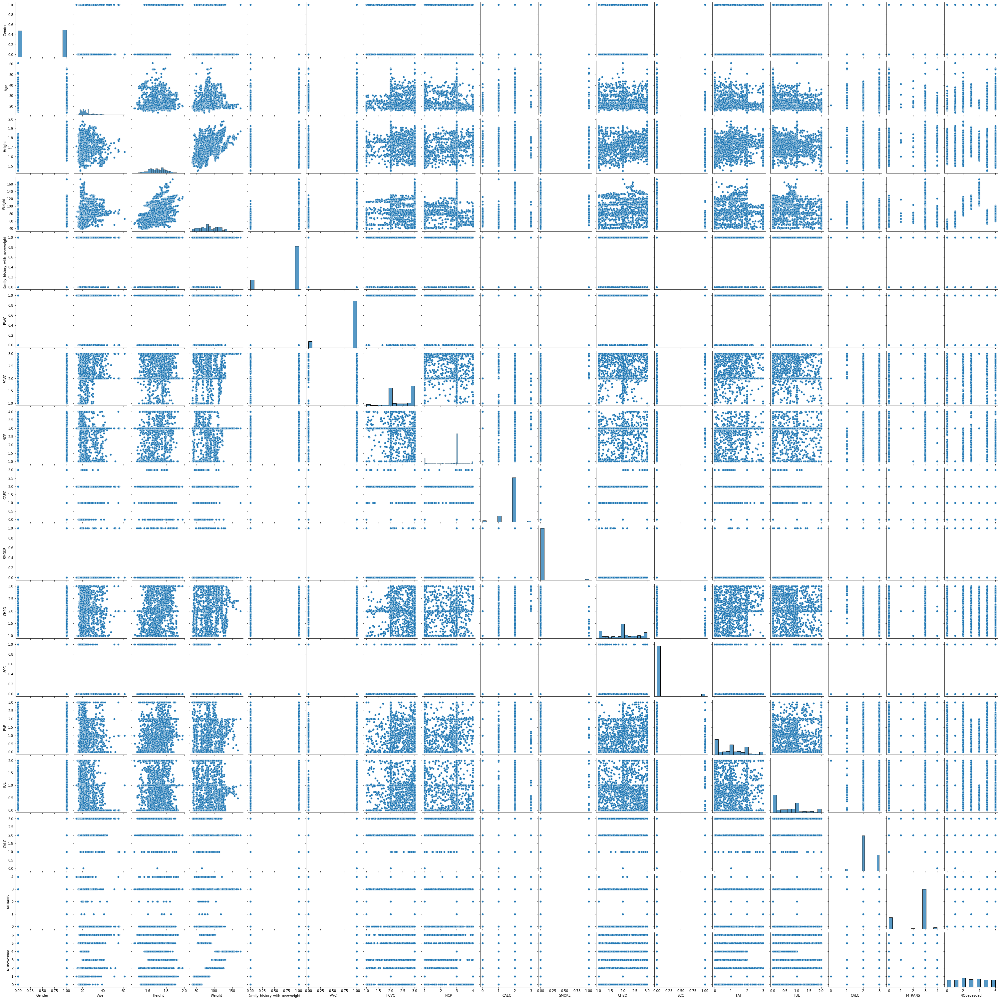

In [ ]:
sns.pairplot(data)

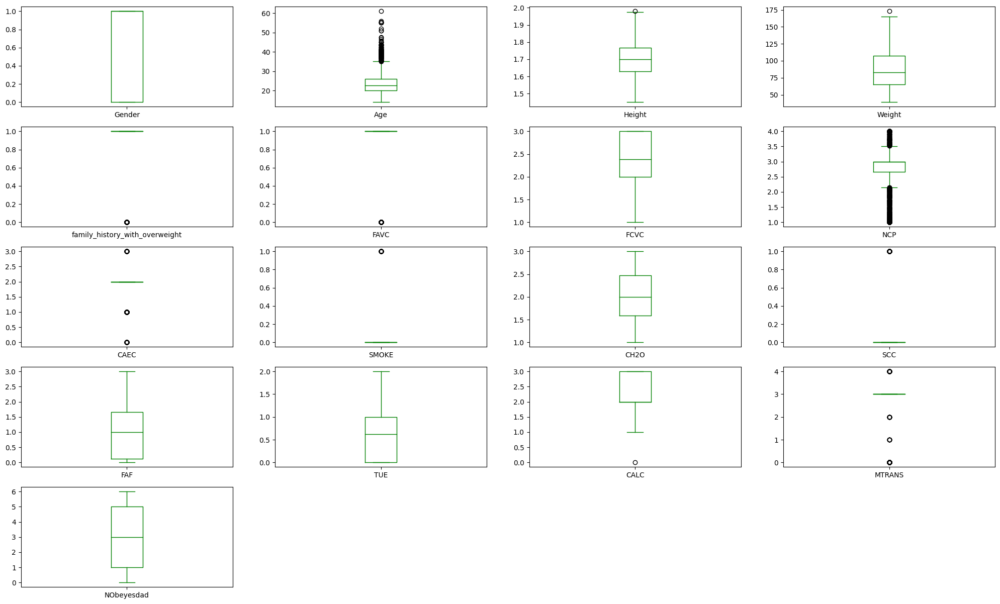

In [38]:
data.plot(color = 'green', kind='box', figsize=(25, 15), subplots=True, layout=(5,4))
plt.show()

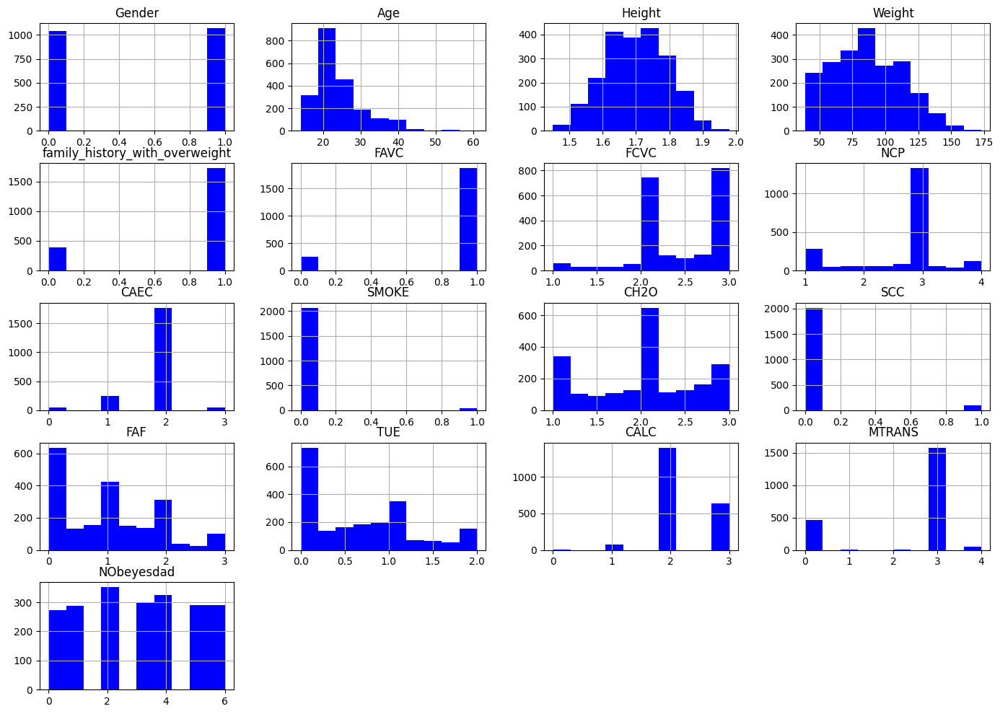

In [37]:
#histogram
data.hist(color='blue',bins=10,figsize=(17,12))
plt.show()

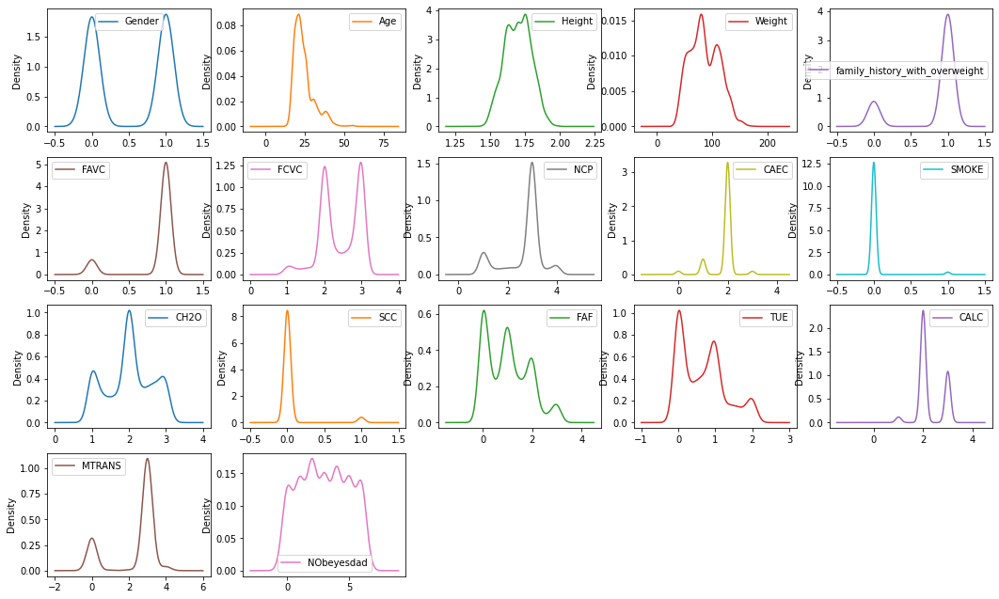

In [ ]:
#Boxplot of each column
data.plot( kind='density', figsize=(18,14), subplots=True, layout=(5,5),sharex=False)
plt.show()

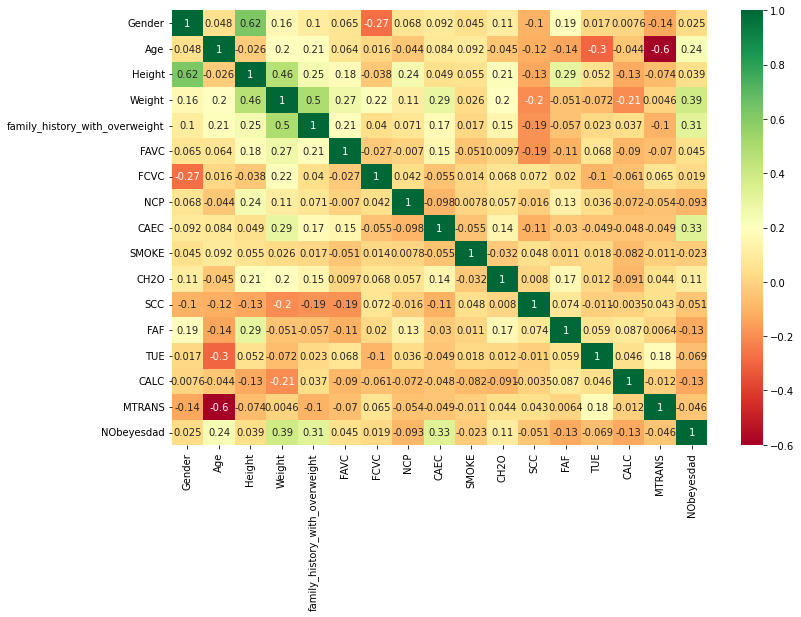

In [ ]:
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(12,8))
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [ ]:
import plotly.graph_objects as go

In [ ]:
column_names = data.columns
no_of_boxes = len(column_names)
colors = [ 'hsl(' + str(h) + ',50%' + ',50%)' for h in np.linspace(0, 360, no_of_boxes)]

fig = go.Figure(data = [go.Box(y = data.loc[:, column_names[i]], marker_color = colors[i], name = column_names[i], boxmean = True, showlegend = True) for i in range(no_of_boxes)])

fig.update_layout(
    xaxis=dict(showgrid = True, zeroline = True, showticklabels = True),
    yaxis=dict(zeroline = True, gridcolor = 'white'),
    paper_bgcolor = 'rgb(233,233,233)',
    plot_bgcolor = 'rgb(233,233,233)')

fig.show()

In [ ]:
# creating a for to replace outlayers using boxplot method
num_var=(data)
for i in num_var:
    # taking quantiles
    Q1 = data[i].quantile(0.25)
    Q3 = data[i].quantile(0.75)
    IQR = Q3 - Q1 # calculating IQR
    data[i] = np.where(data[i]>(Q3+1.5*IQR),(Q3+1.5*IQR),data[i]) # removing outlayers
    data[i] = np.where(data[i]<(Q1-1.5*IQR),(Q1-1.5*IQR),data[i]) # removing outlayers

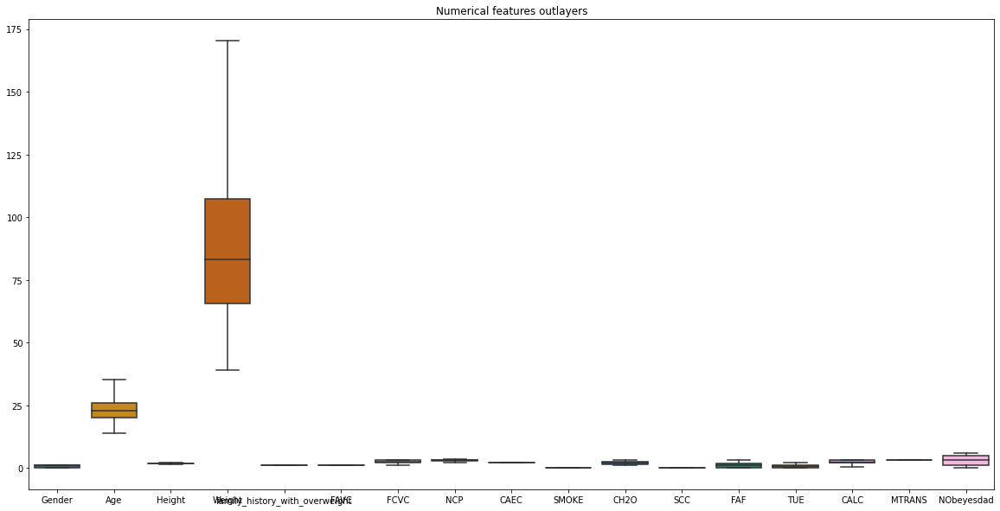

In [ ]:
# Plotting boxplots to numeric features
num_var = ['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight','FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad']
plt.figure(figsize=(20,10))
sns.boxplot(data=data[num_var], 
                 palette="colorblind")
plt.title('Numerical features outlayers');

In [ ]:
#reading data from pandas
col_names = ['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad']
df = pd.read_csv("/content/ObesityDataSet_raw_and_data_sinthetic.csv", header=1, names=col_names)

<AxesSubplot:>

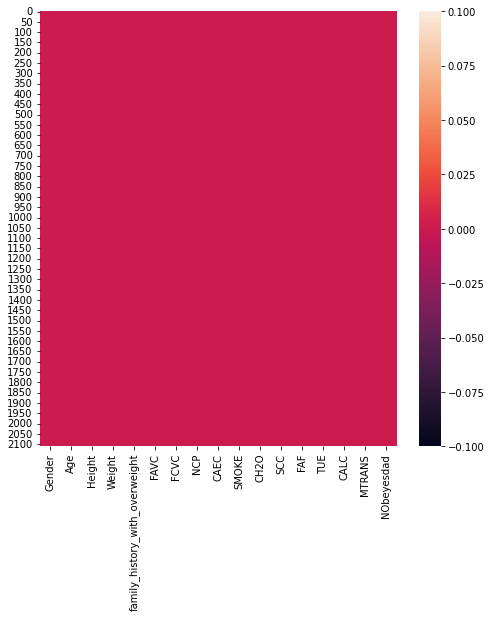

In [ ]:
plt.figure(figsize=(8,8))
sns.heatmap(data.isnull())

In [13]:
data_boxcox = data.copy()
X = data_boxcox.drop(['NObeyesdad'],axis=1)
Y = data_boxcox['NObeyesdad']

In [14]:
#To keep BoxCox data as it is to use the same for later.
data_bal = data_boxcox.copy()

#Getting seperated data with 1 and 0 status.
df_majority = data_bal[data_bal.NObeyesdad==0]
df_minority = data_bal[data_bal.NObeyesdad==1]

#Here we are downsampling the Majority Class Data Points. 
#i.e. We will get equal amount of datapoint as Minority class from Majority class
df_manjority_downsampled = resample(df_majority,replace=False,n_samples=250,random_state=123)
df_downsampled = pd.concat([df_manjority_downsampled,df_minority])
print("Downsampled data:->\n",df_downsampled.NObeyesdad.value_counts())

#Here we are upsampling the Minority Class Data Points. 
#i.e. We will get equal amount of datapoint as Majority class from Minority class
df_monority_Upsampled = resample(df_minority,replace=True,n_samples=2000,random_state=123)
df_Upsampled = pd.concat([df_majority,df_monority_Upsampled])
print("Upsampled data:->\n",df_Upsampled.NObeyesdad.value_counts())

Downsampled data:->
 1    287
0    250
Name: NObeyesdad, dtype: int64
Upsampled data:->
 1    2000
0     272
Name: NObeyesdad, dtype: int64


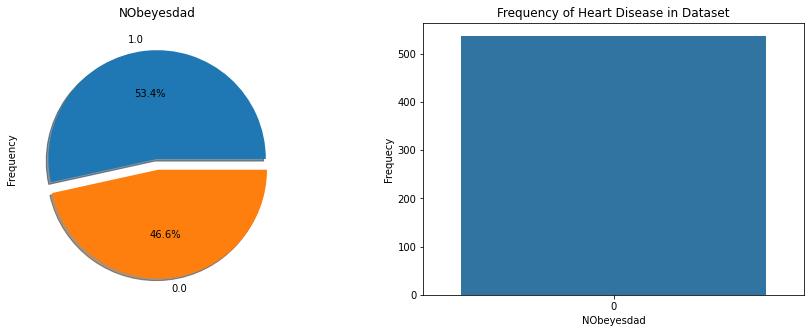

In [ ]:
#Plot the diabetic Values
f,ax=plt.subplots(1,2,figsize=(15,5))
sns.countplot(df_downsampled['NObeyesdad'])
plt.title("Frequency of Heart Disease in Dataset")
plt.xlabel("NObeyesdad")
plt.ylabel("Frequecy")

#Piechart show
df_downsampled['NObeyesdad'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('NObeyesdad')
ax[0].set_ylabel('Frequency')
plt.show()

ValueError: ignored

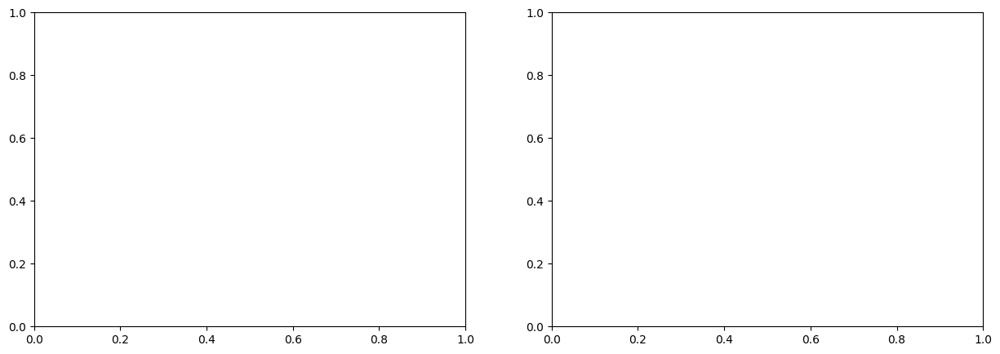

In [16]:
#Plot the diabetic Values
f,ax=plt.subplots(1,2,figsize=(15,5))
sns.countplot(df_Upsampled['NObeyesdad'])
plt.title("Frequency of Heart Disease in Dataset")
plt.xlabel('NObeyesdad')
plt.ylabel("Frequecy")
#Piechart show
df_Upsampled['NObeyesdad'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('NObeyesdad')
ax[0].set_ylabel('Frequency')
plt.show()

In [15]:
#lets describe the data
df_Upsampled.describe().T

,count,mean,std,min,25%,50%,75%,max
Gender,2272.0,0.500880,0.500109,0.0,0.000000,1.00,1.00,1.00
Age,2272.0,21.335405,4.529921,14.0,18.000000,21.00,23.00,61.00
Height,2272.0,1.679421,0.095068,1.5,1.600000,1.67,1.75,1.93
Weight,2272.0,60.815547,9.815196,39.0,53.000000,60.00,68.00,87.00
family_history_with_overweight,2272.0,0.528169,0.499316,0.0,0.000000,1.00,1.00,1.00
FAVC,2272.0,0.729754,0.444185,0.0,0.000000,1.00,1.00,1.00
FCVC,2272.0,2.340570,0.593903,1.0,2.000000,2.00,3.00,3.00
NCP,2272.0,2.729189,0.902928,1.0,3.000000,3.00,3.00,4.00
CAEC,2272.0,1.514965,0.717612,0.0,1.000000,2.00,2.00,3.00
SMOKE,2272.0,0.037852,0.190881,0.0,0.000000,0.00,0.00,1.00


In [16]:
#lets describe the data
df_downsampled.describe().T

,count,mean,std,min,25%,50%,75%,max
Gender,537.0,0.441341,0.497010,0.0,0.000000,0.000000,1.00,1.00
Age,537.0,20.850547,4.259269,14.0,18.000000,20.000000,22.00,61.00
Height,537.0,1.682639,0.097330,1.5,1.600000,1.690000,1.75,1.93
Weight,537.0,56.407184,10.049321,39.0,50.000000,55.000000,63.00,87.00
family_history_with_overweight,537.0,0.502793,0.500458,0.0,0.000000,1.000000,1.00,1.00
FAVC,537.0,0.759777,0.427617,0.0,1.000000,1.000000,1.00,1.00
FCVC,537.0,2.404660,0.589761,1.0,2.000000,2.478891,3.00,3.00
NCP,537.0,2.816290,0.892910,1.0,3.000000,3.000000,3.00,4.00
CAEC,537.0,1.521415,0.660738,0.0,1.000000,2.000000,2.00,3.00
SMOKE,537.0,0.026071,0.159494,0.0,0.000000,0.000000,0.00,1.00


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in f

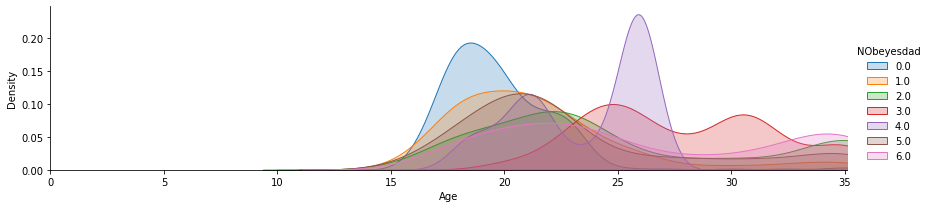

In [ ]:
# Another way to visualize the data is to use FacetGrid to plot multiple kedplots on one plot

fig = sns.FacetGrid(data, hue="NObeyesdad", aspect=4)
fig.map(sns.kdeplot, 'Age', shade=True,)
oldest = data['Age'].max()
fig.set(xlim=(0, oldest))
fig.add_legend()

/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in f

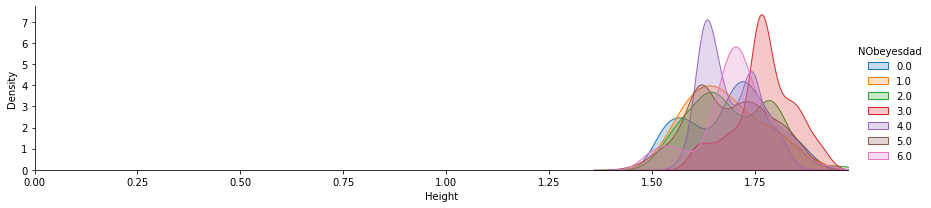

In [ ]:
# Another way to visualize the data is to use FacetGrid to plot multiple kedplots on one plot

fig = sns.FacetGrid(data, hue="NObeyesdad", aspect=4)
fig.map(sns.kdeplot, 'Height', shade=True,)
oldest = data['Height'].max()
fig.set(xlim=(0, oldest))
fig.add_legend()

/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in f

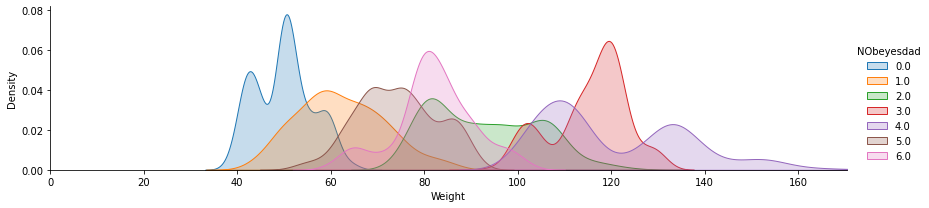

In [ ]:
# Another way to visualize the data is to use FacetGrid to plot multiple kedplots on one plot

fig = sns.FacetGrid(data, hue="NObeyesdad", aspect=4)
fig.map(sns.kdeplot, 'Weight', shade=True,)
oldest = data['Weight'].max()
fig.set(xlim=(0, oldest))
fig.add_legend()

/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/usr/local/lib/python3.9/dist-packages/seaborn/axisgrid.py:848: FutureWarning:



`shade` is now deprecated in f

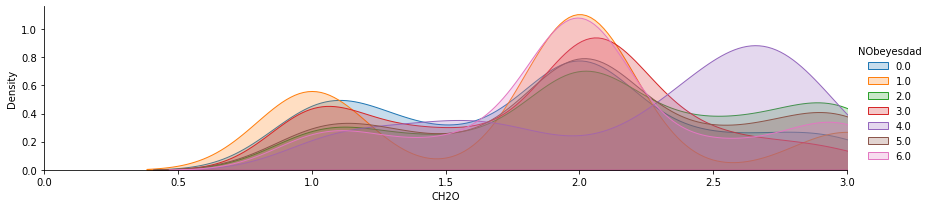

In [ ]:
# Another way to visualize the data is to use FacetGrid to plot multiple kedplots on one plot

fig = sns.FacetGrid(data, hue="NObeyesdad", aspect=4)
fig.map(sns.kdeplot, 'CH2O', shade=True,)
oldest = data['CH2O'].max()
fig.set(xlim=(0, oldest))
fig.add_legend()

<Figure size 3000x3000 with 0 Axes>

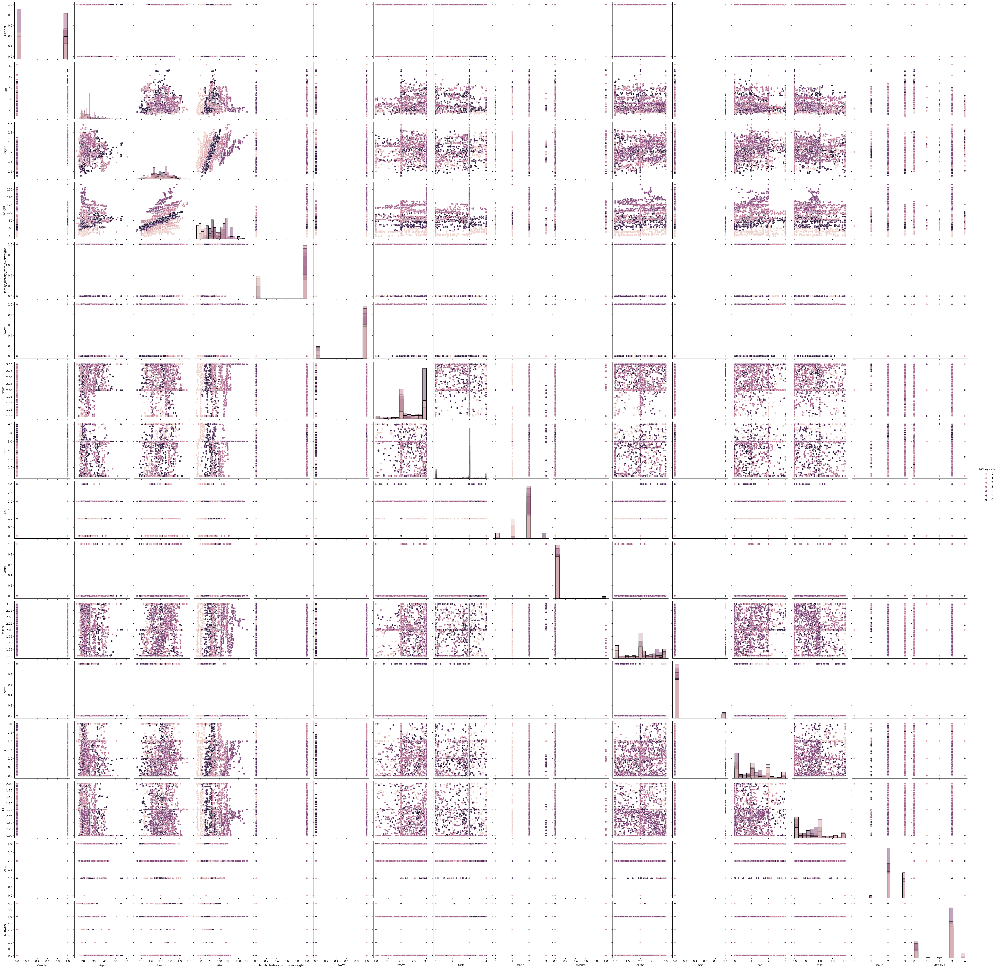

In [39]:
plt.figure(figsize=(30, 30))
sns.pairplot(data, hue='NObeyesdad', height=3, diag_kind='hist')

In [17]:
from sklearn.metrics import confusion_matrix

In [18]:
from sklearn import  metrics 
X = df_Upsampled.drop(['NObeyesdad'],axis=1)
Y = df_Upsampled['NObeyesdad']
X_train , X_test , y_train , y_test = train_test_split(X,Y,test_size=0.20,random_state=0)

XGBR = XGBClassifier(learning_rate =0.1,n_estimators=100000,max_depth=6,min_child_weight=6,gamma=0,subsample=0.6,colsample_bytree=0.8,
reg_alpha=0.005, objective= 'binary:logistic', nthread=2, scale_pos_weight=1, seed=27)
XGBR.fit(X_train,y_train)
y_pred = XGBR.predict(X_test)
print(classification_report(y_pred,y_test))
print(accuracy_score(y_pred,y_test))
#confusion_matrix(XGBR,X_test,y_test,labels=["Heart Disease","No-Heart Disease"],cm=plt.cm.Blues)

              precision    recall  f1-score   support

           0       0.88      1.00      0.94        51
           1       1.00      0.98      0.99       404

    accuracy                           0.98       455
   macro avg       0.94      0.99      0.96       455
weighted avg       0.99      0.98      0.99       455

0.9846153846153847


In [ ]:
featur_names = ['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight','FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE','CALC', 'MTRANS']
features = XGBR.feature_importances_
features

array([0.01322618, 0.01423721, 0.07375407, 0.11385488, 0.        ,
       0.        , 0.24368954, 0.3654835 , 0.        , 0.        ,
       0.11423489, 0.        , 0.01747325, 0.02345704, 0.02058946,
       0.        ], dtype=float32)

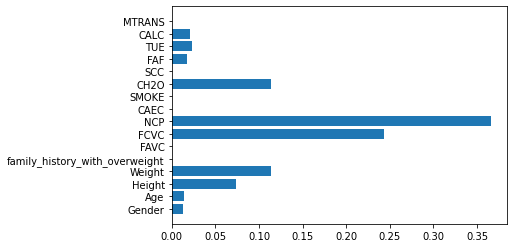

In [ ]:
plt.figure(facecolor='w')
plt.barh(featur_names,features)
plt.show()

In [ ]:
data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

In [19]:
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
import itertools

In [20]:
X = np.array(df_Upsampled[['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad']])
Y = np.array(df_Upsampled.NObeyesdad.T)
X_train , X_test , y_train , y_test = train_test_split(X,Y,test_size=0.20,random_state=0)


models = []
models.append(("XGB",XGBClassifier()))
models.append(("ADB",AdaBoostClassifier()))
models.append(("GB",GradientBoostingClassifier()))
models.append(("LightGBM",LGBMClassifier()))
models.append(("Catboost",CatBoostClassifier()))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94        51
           1       1.00      0.98      0.99       404

    accuracy                           0.98       455
   macro avg       0.94      0.99      0.96       455
weighted avg       0.99      0.98      0.99       455

0.9846153846153847


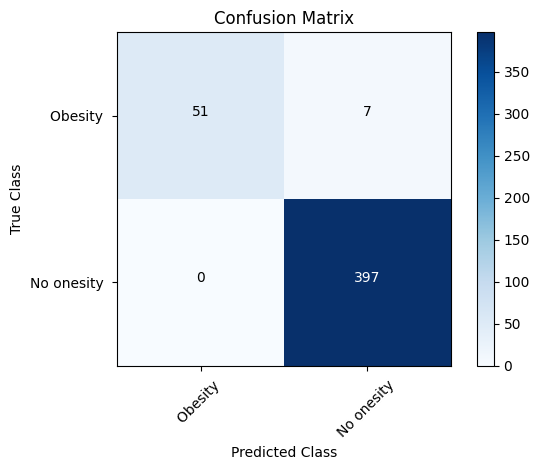

In [28]:
#XGB
classes = ["Obesity ", "No onesity "]
X = df_Upsampled.drop(['NObeyesdad'],axis=1)
Y = df_Upsampled['NObeyesdad']
X_train , X_test , y_train , y_test = train_test_split(X,Y,test_size=0.20,random_state=0)
Model1 = XGBClassifier (learning_rate =0.1,n_estimators=100000,max_depth=6,min_child_weight=6,gamma=0,subsample=0.6,colsample_bytree=0.8,
reg_alpha=0.005, objective= 'binary:logistic', nthread=2, scale_pos_weight=1, seed=27)

#(learning_rate =0.1,n_estimators=10000,max_depth=4,min_child_weight=6,gamma=0,subsample=0.6,colsample_bytree=0.8,reg_alpha=0.005, objective= 'binary:logistic', nthread=2, scale_pos_weight=1, seed=27)

Model1.fit(X_train,y_train)
y_pred = Model1.predict(X_test)
fpr_Model1, tpr_Model1, thresholds_Model1 = roc_curve(y_test, y_pred)
roc_auc_Model1 = auc (fpr_Model1, tpr_Model1)
precision_Model1, recall_Model1, th_Model1 = precision_recall_curve(y_test, y_pred)
print(classification_report(y_pred,y_test))
print(accuracy_score(y_pred,y_test))

#confusion_matrix(Model1,X_test,y_test,display_labels=["LD","Non-LD"],cmap=plt.cm.Blues)
# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")

# Add labels to the plot
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], 'd'),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

In [ ]:
#Features Importance Bar Plot
featur_names = ['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight','FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS']
features =Model1.feature_importances_
features

array([0.01322618, 0.01423721, 0.07375407, 0.11385488, 0.        ,
       0.        , 0.24368954, 0.3654835 , 0.        , 0.        ,
       0.11423489, 0.        , 0.01747325, 0.02345704, 0.02058946,
       0.        ], dtype=float32)

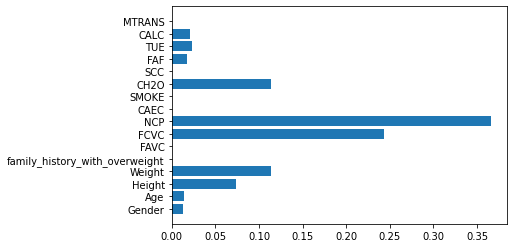

In [ ]:
plt.figure(facecolor='w')
plt.barh(featur_names,features)
plt.show()

              precision    recall  f1-score   support

           0       0.95      1.00      0.97        55
           1       1.00      0.99      1.00       400

    accuracy                           0.99       455
   macro avg       0.97      1.00      0.98       455
weighted avg       0.99      0.99      0.99       455

0.9934065934065934


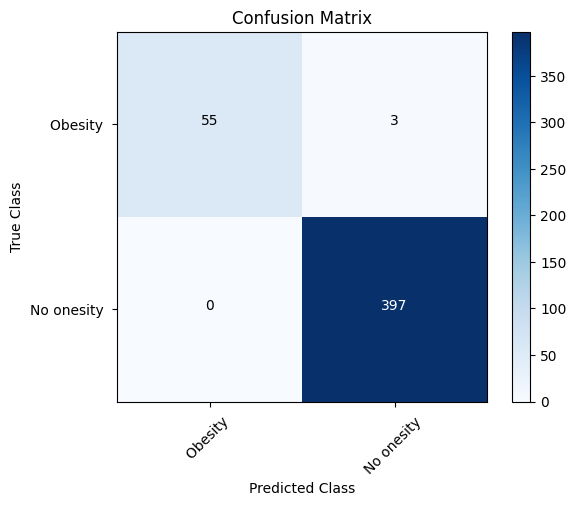

In [32]:
#Ada Boost
display_labels=["LD","Non-LD"]
X = df_Upsampled.drop(['NObeyesdad'],axis=1)
Y = df_Upsampled['NObeyesdad']
X_train , X_test , y_train , y_test = train_test_split(X,Y,test_size=0.20,random_state=0)
Model2 = AdaBoostClassifier(n_estimators=20000,learning_rate=0.1,random_state=None)
#(random_state=0, learning_rate =0.1,n_estimators=100)
Model2.fit(X_train,y_train)
y_pred = Model2.predict(X_test)
fpr_Model2, tpr_Model2, thresholds_Model2 = roc_curve(y_test, y_pred)
roc_auc_Model2 = auc (fpr_Model2, tpr_Model2)
precision_Model2, recall_Model2, th_Model2 = precision_recall_curve(y_test, y_pred)
print(classification_report(y_pred,y_test))
print(accuracy_score(y_pred,y_test))
# confusion_matrix(Model2,X_test,y_test,display_labels=["LD","Non-LD"],cmap=plt.cm.Blues)
# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")

# Add labels to the plot
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], 'd'),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")



In [ ]:
#Features Importance Bar Plot
featur_names = ['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight','FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS']
features =Model2.feature_importances_
features

array([0.0045 , 0.0312 , 0.41995, 0.4229 , 0.     , 0.     , 0.0127 ,
       0.03225, 0.     , 0.     , 0.00815, 0.     , 0.03665, 0.03065,
       0.00105, 0.     ])

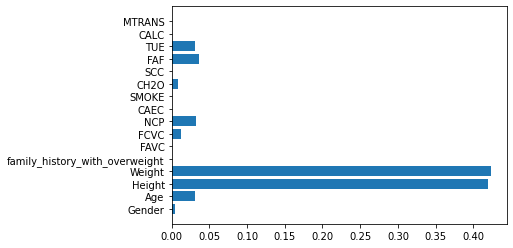

In [ ]:
plt.figure(facecolor='w')
plt.barh(featur_names,features)
plt.show()

In [ ]:
X_train.isnull().sum()

Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
dtype: int64

              precision    recall  f1-score   support

           0       0.93      1.00      0.96        54
           1       1.00      0.99      0.99       401

    accuracy                           0.99       455
   macro avg       0.97      1.00      0.98       455
weighted avg       0.99      0.99      0.99       455

0.9912087912087912


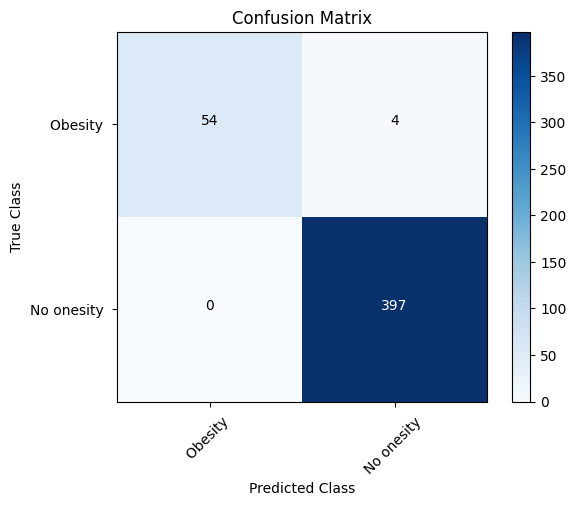

In [33]:
# GB Boost
X = df_Upsampled.drop(['NObeyesdad'],axis=1)
Y = df_Upsampled['NObeyesdad']
X_train , X_test , y_train , y_test = train_test_split(X,Y,test_size=0.20,random_state=0)
Model3 = GradientBoostingClassifier(random_state=45, learning_rate =0.1,n_estimators=10000,max_depth=10)
Model3.fit(X_train,y_train)
y_pred = Model3.predict(X_test)
fpr_Model3, tpr_Model3, thresholds_Model3 = roc_curve(y_test, y_pred)
roc_auc_Model3 = auc (fpr_Model3, tpr_Model3)
precision_Model3, recall_Model3, th_Model3 = precision_recall_curve(y_test, y_pred)
print(classification_report(y_pred,y_test))
print(accuracy_score(y_pred,y_test))
#plot_confusion_matrix(Model3,X_test,y_test,display_labels=["LD","Non-LD"],cmap=plt.cm.Blues)
# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")

# Add labels to the plot
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], 'd'),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")


In [ ]:
#Features Importance Bar Plot
featur_names = ['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight','FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS']
features =Model3.feature_importances_
features

array([9.80203653e-17, 9.79640599e-03, 3.69211608e-01, 3.18436834e-01,
       0.00000000e+00, 0.00000000e+00, 2.44287923e-16, 2.08079656e-01,
       0.00000000e+00, 0.00000000e+00, 5.00627020e-02, 0.00000000e+00,
       1.48682217e-03, 4.13060671e-02, 1.61990442e-03, 0.00000000e+00])

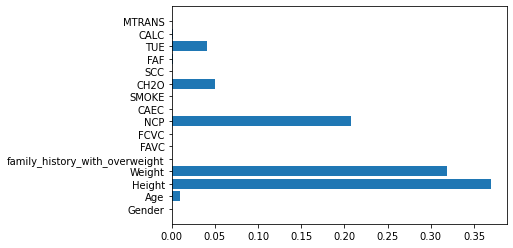

In [ ]:
plt.figure(facecolor='w')
plt.barh(featur_names,features)
plt.show()

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        56
           1       1.00      0.99      1.00       399

    accuracy                           1.00       455
   macro avg       0.98      1.00      0.99       455
weighted avg       1.00      1.00      1.00       455

0.9956043956043956


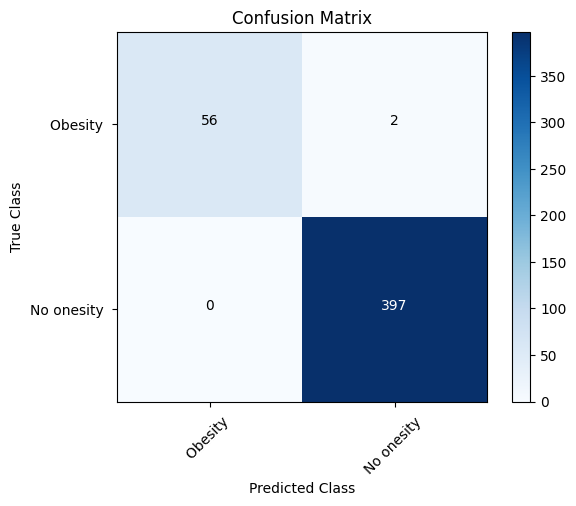

In [34]:
#LightGBM
X = df_Upsampled.drop(['NObeyesdad'],axis=1)
Y = df_Upsampled['NObeyesdad']
X_train , X_test , y_train , y_test = train_test_split(X,Y,test_size=0.20,random_state=0)
Model4 = LGBMClassifier(random_state=45, n_estimators= 10000, max_depth=8)
Model4.fit(X_train,y_train)
y_pred = Model4.predict(X_test)
fpr_Model4, tpr_Model4, thresholds_Model4 = roc_curve(y_test, y_pred)
roc_auc_Model4 = auc (fpr_Model4, tpr_Model4)
precision_Model4, recall_Model4, th_Model4 = precision_recall_curve(y_test, y_pred)
print(classification_report(y_pred,y_test))
print(accuracy_score(y_pred,y_test))
#plot_confusion_matrix(Model4,X_test,y_test,display_labels=["LD","Non-LD"],cmap=plt.cm.Blues)
# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")

# Add labels to the plot
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], 'd'),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")


In [ ]:
#Features Importance Bar Plot
featur_names = ['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight','FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS']
features =Model4.feature_importances_
features

array([ 139,  594, 5862, 5763,    0,    0,  281,  201,    0,    0,  137,
          0,  264,  326,   86,    0], dtype=int32)

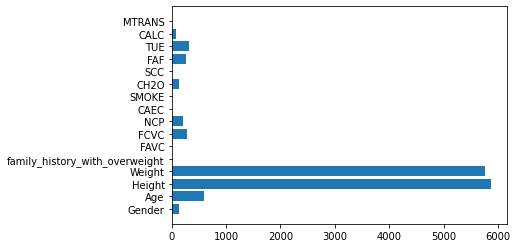

In [ ]:
plt.figure(facecolor='w')
plt.barh(featur_names,features)
plt.show()

Learning rate set to 0.013295
0:	learn: 0.6705193	total: 60.8ms	remaining: 1m
1:	learn: 0.6475286	total: 80.1ms	remaining: 40s
2:	learn: 0.6224196	total: 102ms	remaining: 33.9s
3:	learn: 0.6056691	total: 118ms	remaining: 29.3s
4:	learn: 0.5881854	total: 125ms	remaining: 24.9s
5:	learn: 0.5699287	total: 136ms	remaining: 22.5s
6:	learn: 0.5555353	total: 149ms	remaining: 21.1s
7:	learn: 0.5408916	total: 156ms	remaining: 19.3s
8:	learn: 0.5196379	total: 164ms	remaining: 18.1s
9:	learn: 0.5019957	total: 175ms	remaining: 17.3s
10:	learn: 0.4913573	total: 184ms	remaining: 16.5s
11:	learn: 0.4735291	total: 193ms	remaining: 15.9s
12:	learn: 0.4580426	total: 206ms	remaining: 15.6s
13:	learn: 0.4426231	total: 210ms	remaining: 14.8s
14:	learn: 0.4270613	total: 218ms	remaining: 14.3s
15:	learn: 0.4115180	total: 225ms	remaining: 13.8s
16:	learn: 0.4015145	total: 238ms	remaining: 13.8s
17:	learn: 0.3881769	total: 243ms	remaining: 13.3s
18:	learn: 0.3788020	total: 256ms	remaining: 13.2s
19:	learn: 0.3

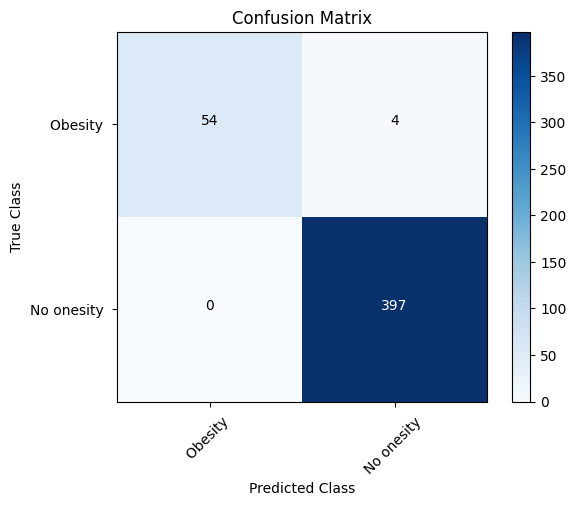

In [35]:
#CAT Boost
X = df_Upsampled.drop(['NObeyesdad'],axis=1)
Y = df_Upsampled['NObeyesdad']
X_train , X_test , y_train , y_test = train_test_split(X,Y,test_size=0.20,random_state=0)
Model5 = CatBoostClassifier(random_state=45, n_estimators=1000, max_depth=7)
Model5.fit(X_train,y_train)
y_pred = Model5.predict(X_test)
fpr_Model5, tpr_Model5, thresholds_Model5 = roc_curve(y_test, y_pred)
roc_auc_Model5 = auc (fpr_Model5, tpr_Model5)
precision_Model5, recall_Model5, th_Model5 = precision_recall_curve(y_test, y_pred)
print(classification_report(y_pred,y_test))
print(accuracy_score(y_pred,y_test))
#plot_confusion_matrix(Model5,X_test,y_test,display_labels=["LD","Non-LD"],cmap=plt.cm.Blues)
# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")

# Add labels to the plot
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], 'd'),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")


In [ ]:
#Features Importance Bar Plot
featur_names = ['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight','FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS']
features =Model5.feature_importances_
features

array([ 1.18192362,  4.07585412, 24.36085168, 37.89480269,  0.        ,
        0.        , 10.16880362,  4.94202068,  0.        ,  0.        ,
        6.61085221,  0.        ,  4.22663955,  4.02991451,  2.50833732,
        0.        ])

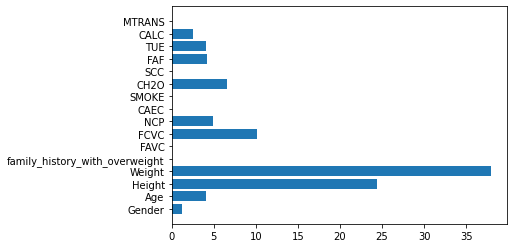

In [ ]:
plt.figure(facecolor='w')
plt.barh(featur_names,features)
plt.show()

In [ ]:
from sklearn import metrics
from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc, roc_curve, recall_score, 
                             classification_report, f1_score, average_precision_score, precision_recall_fscore_support)

In [ ]:
X = data.drop(['NObeyesdad'],axis=1)
Y = data['NObeyesdad']

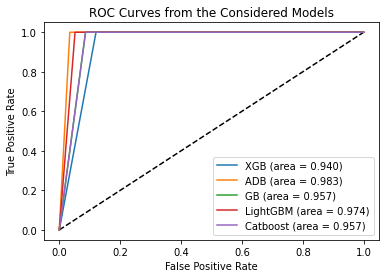

In [ ]:
# Plot ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_Model1, tpr_Model1, label='XGB (area = %0.3f)' % roc_auc_Model1)
plt.plot(fpr_Model2, tpr_Model2, label='ADB (area = %0.3f)' % roc_auc_Model2)
plt.plot(fpr_Model3, tpr_Model3, label='GB (area = %0.3f)' % roc_auc_Model3)
plt.plot(fpr_Model4, tpr_Model4, label='LightGBM (area = %0.3f)' % roc_auc_Model4)
plt.plot(fpr_Model5, tpr_Model5, label='Catboost (area = %0.3f)' % roc_auc_Model5)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves from the Considered Models')
plt.legend(loc='best')
plt.show()